# Machine Learning on IBM i : Scikit Learn, pandas, seaborn and Db2 for i 

Version May 2020

##### The Dataset

From a telecommunications company. It includes information about:

   - Customers who left within the last month – the column is called Churn

   - Services that each customer has signed up for – phone, multiple lines, internet, online security, online backup, device protection, tech support, and streaming TV and movies

   - Customer account information – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges

   - Demographic info about customers – gender, age range, and if they have partners and dependents


#### Features Information (non exhaustive) :
- Partner: whether the customer has a partner or not (Yes, No),
- Dependents: whether the customer has dependents or not (Yes, No),
- OnlineBackup: Whether the customer has an online backup or not (Yes, No, No internet service),
- tenure: number of months the customer has stayed with the company,
- MonthlyCharges: the amount charged to the customer monthly,
- TotalCharges: the total amount charged to the customer.
   

In [1]:
%pwd

'/home/BENOIT/firstdemo-scikitlearn-ibmi'

In [2]:
# Dowload the original dataset if necessary
#!wget https://community.watsonanalytics.com/wp-content/uploads/2015/03/WA_Fn-UseC_-Telco-Customer-Churn.csv  --no-check-certificate

# Import packages & libraries 
import os
import pandas as pd
from pandas import Series, DataFrame
#import pandas_profiling

pd.set_option('display.max_rows', None,'display.max_columns', None)

import numpy as np

from collections import Counter

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve, cross_validate
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, make_scorer, roc_auc_score,accuracy_score, roc_curve
from scipy.stats import ks_2samp

from sklearn.preprocessing import  StandardScaler

#from sklearn import cross_validation
from sklearn import metrics

import os
import pandas as pd
import numpy as np
from sklearn import preprocessing, svm
from itertools import combinations
from sklearn.preprocessing import PolynomialFeatures, LabelEncoder, StandardScaler
import sklearn.feature_selection
from sklearn.model_selection import train_test_split
from collections import defaultdict
from sklearn import metrics

import seaborn as sns
import matplotlib.pyplot as plt


import sklearn
print("sklearn version :", sklearn.__version__)


/QOpenSys/pkgs/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d
Exception ignored in: <Finalize object, dead>
Traceback (most recent call last):
  File "/QOpenSys/pkgs/lib/python3.6/multiprocessing/util.py", line 186, in __call__
    res = self._callback(*self._args, **self._kwargs)
  File "/QOpenSys/pkgs/lib/python3.6/multiprocessing/synchronize.py", line 87, in _cleanup
    sem_unlink(name)
FileNotFoundError: [Errno 2] No such file or directory


sklearn version : 0.19.1


## 2. Loading Our Dataset from a Relational Database - Db2 for i

In [3]:

import ibm_db_dbi as dbi


# Telco Churn dataset from a CRM datasource - here Db2 for i in CHURN/CUSTCHURN2 7044 records

sql="SELECT * from CHURN.CUSTCHURN3"
pd.set_option('display.max_columns', 30)
try:
    conn = dbi.connect()
    c1 = conn.cursor()
    c1.execute(sql)
    row = c1.fetchone()
    print ("Example:" ,row)
    df_fromdb2 = pd.read_sql(sql, conn)
    conn.close()
    
    df_fromdb2.info()
    

    
except Exception as err:
    print('Error'+ str(err))

Example: ('7590-VHVEG', 'Female', Decimal('0'), 'Yes', 'No ', Decimal('1'), 'No ', 'No phone service', 'DSL        ', 'No                 ', 'Yes                ', 'No                 ', 'No                 ', 'No                 ', 'No                 ', 'Month-to-month', 'Yes', 'Electronic check         ', Decimal('29.85'), Decimal('29.85'), 'No ')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
CUSTOMERID          7043 non-null object
GENDER              7043 non-null object
SENIORCITIZEN       7043 non-null float64
PARTNER             7043 non-null object
DEPENDENTS          7043 non-null object
TENURE              7043 non-null float64
PHONESERVICE        7043 non-null object
MULTIPLELINES       7043 non-null object
INTERNETSERVICE     7043 non-null object
ONLINESECURITY      7043 non-null object
ONLINEBACKUP        7043 non-null object
DEVICEPROTECTION    7043 non-null object
TECHSUPPORT         7043 non-null object
STREA

In [4]:
display(df_fromdb2)

,CUSTOMERID,GENDER,SENIORCITIZEN,PARTNER,DEPENDENTS,TENURE,PHONESERVICE,MULTIPLELINES,INTERNETSERVICE,ONLINESECURITY,ONLINEBACKUP,DEVICEPROTECTION,TECHSUPPORT,STREAMINGTV,STREAMINGMOVIES,CONTRACT,PAPERLESSBILLING,PAYMENTMETHOD,MONTHLYCHARGES,TOTALCHARGES,CHURN
0,7590-VHVEG,Female,0.0,Yes,No,1.0,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0.0,No,No,34.0,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0.0,No,No,2.0,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0.0,No,No,45.0,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0.0,No,No,2.0,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,9305-CDSKC,Female,0.0,No,No,8.0,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,Yes
6,1452-KIOVK,Male,0.0,No,Yes,22.0,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.40,No
7,6713-OKOMC,Female,0.0,No,No,10.0,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.90,No
8,7892-POOKP,Female,0.0,Yes,No,28.0,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,6388-TABGU,Male,0.0,No,Yes,62.0,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


## 3. Load Dataframe from CSV file (IFS) &Data Visualization

In [5]:

customer_data= pd.read_csv('WA_Fn-UseC_-Telco-Customer-Churn.csv')
#customer_data=df_fromdb2

In [6]:
# Find correlations method= pearson, kendall, spearman ...
pearsoncorr=customer_data.corr(method='pearson')
pearsoncorr

,SeniorCitizen,tenure,MonthlyCharges
SeniorCitizen,1.000000,0.016567,0.220173
tenure,0.016567,1.000000,0.247900
MonthlyCharges,0.220173,0.247900,1.000000


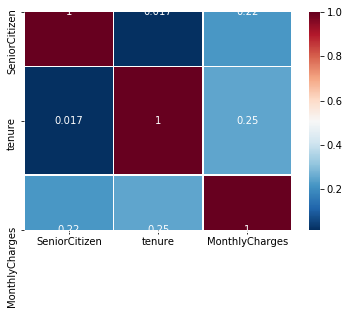

In [7]:
sns.heatmap(pearsoncorr, 
            xticklabels=pearsoncorr.columns,
            yticklabels=pearsoncorr.columns,
            cmap='RdBu_r',
            annot=True,
            linewidth=0.5)

In [8]:
# Describe columns wit>h numerical values
pd.set_option('precision', 3)
customer_data.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000,7043.000,7043.000
mean,0.162,32.371,64.762
std,0.369,24.559,30.090
min,0.000,0.000,18.250
25%,0.000,9.000,35.500
50%,0.000,29.000,70.350
75%,0.000,55.000,89.850
max,1.000,72.000,118.750


In [9]:
# After running this cell we will see that we have no missing values
customer_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
customerID          7043 non-null object
gender              7043 non-null object
SeniorCitizen       7043 non-null int64
Partner             7043 non-null object
Dependents          7043 non-null object
tenure              7043 non-null int64
PhoneService        7043 non-null object
MultipleLines       7043 non-null object
InternetService     7043 non-null object
OnlineSecurity      7043 non-null object
OnlineBackup        7043 non-null object
DeviceProtection    7043 non-null object
TechSupport         7043 non-null object
StreamingTV         7043 non-null object
StreamingMovies     7043 non-null object
Contract            7043 non-null object
PaperlessBilling    7043 non-null object
PaymentMethod       7043 non-null object
MonthlyCharges      7043 non-null float64
TotalCharges        7043 non-null object
Churn               7043 non-null object
dtypes: float64(1), int64(2), obj

In [10]:
# Drop customerID column
customer_data = customer_data.drop('customerID', axis=1)
customer_data.head(5)

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [11]:
# Convert TotalCharges column to numeric as it is detected as object
new_col = pd.to_numeric(customer_data.iloc[:, 18], errors='coerce')


In [12]:
# Modify our dataframe to reflect the new datatype
customer_data.iloc[:, 18] = pd.Series(new_col)
customer_data

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,Female,0,No,No,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,Yes
6,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,Yes,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.40,No
7,Female,0,No,No,10,No,No phone service,DSL,Yes,No,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.90,No
8,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,Male,0,No,Yes,62,Yes,No,DSL,Yes,Yes,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [13]:
# Check if we have any NaN values
customer_data.isnull().values.any()

True

In [14]:
customer_data = customer_data.fillna(customer_data.mean())

In [15]:
#from sklearn.preprocessing import Imputer
#Sklearn 0.22+ :  no more Imputer in preprocessing 
from sklearn.impute import SimpleImputer

imp = SimpleImputer(missing_values="NaN", strategy="mean")

#customer_data.iloc[:, 18] = imp.fit_transform(customer_data.iloc[:, 18].values.reshape(-1, 1))
customer_data.iloc[:, 18] = pd.Series(customer_data.iloc[:, 18])
customer_data.isnull().values.any() 
customer_data.info()

ImportError: cannot import name 'is_scalar_nan'

### Plot Relationships

In [ ]:
# Plot Tenure Frequency count
sns.set(style="darkgrid")
sns.set_palette("hls", 3)
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.countplot(x="tenure", hue="Churn", data=customer_data)

In [ ]:
#Contract
sns.set(style="darkgrid")
sns.set_palette("hls", 3)
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.countplot(x="Contract", hue="Churn", data=customer_data)

In [ ]:
# Plot TechSupport Frequency count
sns.set(style="darkgrid")
sns.set_palette("hls", 3)
fig, ax = plt.subplots(figsize=(20,10))
ax = sns.countplot(x="TechSupport", hue="Churn", data=customer_data)


In [ ]:
# Create Grid for pairwise relationships
# allows us to see both distribution of single variables and relationships between two variables.
gr = sns.PairGrid(customer_data, height=5, hue="Churn")
gr = gr.map_diag(plt.hist)
gr = gr.map_offdiag(plt.scatter)
gr = gr.add_legend()

In [ ]:
# Set up plot size
fig, ax = plt.subplots(figsize=(6,6))

# Attributes distribution
a = sns.boxplot(orient="v", palette="hls", data=customer_data.iloc[:, 18], fliersize=14)

In [ ]:
# Tenure data distribution
histogram = sns.distplot(customer_data.iloc[:, 4], hist=True)
plt.show()


In [ ]:
# Monthly Charges data distribution
histogram = sns.distplot(customer_data.iloc[:, 17], hist=True)
plt.show()

In [ ]:
pd.set_option('precision', 3)
customer_data.describe()
customer_data.describe(exclude=np.number)
customer_data.corr(method='pearson')
display(customer_data)

customer_data_encoded = pd.get_dummies(customer_data)
customer_data_encoded.head(10)

# Create training data for non-preprocessed approach
X_npp = customer_data.iloc[:, :-1].apply(LabelEncoder().fit_transform)
pd.DataFrame(X_npp).head(5)

# Create training data for that will undergo preprocessing
X = customer_data_encoded.iloc[:, :-2]
X.head()

# Extract labels
y_unenc = customer_data['Churn']

# Convert strings of 'yes' and 'no' to binary values of 0 or 1
le = preprocessing.LabelEncoder()
le.fit(y_unenc)

y_le = le.transform(y_unenc)
pd.DataFrame(y_le)



## Outlier Detection

In [ ]:
# Calculate the Z-score using median value and median absolute deviation for more robust calculations
# Working on Monthly Charges column
threshold = 3

median = np.median(X['MonthlyCharges'])
median_absolute_deviation = np.median([np.abs(x - median) for x in X['MonthlyCharges']])
modified_z_scores = [0.6745 * (x - median) / median_absolute_deviation
                         for x in X['MonthlyCharges']]
results = np.abs(modified_z_scores) > threshold

print(np.any(results))

In [ ]:
# Do the same for Total Charges column but using the interquartile method

quartile_1, quartile_3 = np.percentile(X['TotalCharges'], [25, 75])
iqr = quartile_3 - quartile_1
lower_bound = quartile_1 - (iqr * 1.5)
upper_bound = quartile_3 + (iqr * 1.5)

print(np.where((X['TotalCharges'] > upper_bound) | (X['TotalCharges'] < lower_bound)))


## Feature Engineering

In [ ]:

# Find interactions between current features and append them to the dataframe
def add_interactions(dataset):
    # Get feature names
    comb = list(combinations(list(dataset.columns), 2))
    col_names = list(dataset.columns) + ['_'.join(x) for x in comb]
    
    # Find interactions
    poly = PolynomialFeatures(interaction_only=True, include_bias=False)
    dataset = poly.fit_transform(dataset)
    dataset = pd.DataFrame(dataset)
    dataset.columns = col_names
    
    # Remove interactions with 0 values
    no_inter_indexes = [i for i, x in enumerate(list((dataset ==0).all())) if x]
    dataset = dataset.drop(dataset.columns[no_inter_indexes], axis=1)
    
    return dataset


X_inter = add_interactions(X)
X_inter.head(15)

# Select best features
select = sklearn.feature_selection.SelectKBest(k=25)
selected_features = select.fit(X_inter, y_le)
indexes = selected_features.get_support(indices=True)
col_names_selected = [X_inter.columns[i] for i in indexes]

X_selected = X_inter[col_names_selected]
X_selected.head(10)

## Data Split (Training / Test) and Normalization (x = (x - xmin) / (xmax - xmin) ) 

In [ ]:
#Split Data
X_train, X_test, y_train, y_test = train_test_split(X_selected, y_le,\
                                                    test_size=0.33, random_state=42)
print("training size: ", X_train.shape, y_train.shape)
print("test size",  X_test.shape, y_test.shape)

# Use StandardScaler
scaler = preprocessing.StandardScaler().fit(X_train, y_train)
X_train_scaled = scaler.transform(X_train)

pd.DataFrame(X_train_scaled, columns=X_train.columns).head()
pd.DataFrame(y_train).head(5)

## Building a Classifier 
### SVM (Support Vector Machine algorithm) - scikit learn SVC 

In [ ]:

#Support Vector Macines on preprocessed data
from sklearn.svm import SVC
# Run classifier
clf_svc = svm.SVC(random_state=42, probability=True)
clf_svc.fit(X_train_scaled, y_train)


### Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

clf_lr = LogisticRegression()
model = clf_lr.fit(X_train_scaled, y_train)
model

### Multilayer Perceptron (Neural Network) 

In [ ]:
from sklearn.neural_network import MLPClassifier

clf_mlp = MLPClassifier(verbose=0)
clf_mlp.fit(X_train_scaled, y_train)

# Note: MLP as a NN, can use data without the feature engineering step, as the NN will handle that automatically

## Model Evaluation
### SVC

In [ ]:
# Use the scaler fit on trained data to scale our test data
X_test_scaled = scaler.transform(X_test)
pd.DataFrame(X_test_scaled, columns=X_train.columns).head()

# Get accuracy score
from sklearn.metrics import accuracy_score
# Get model confidence of predictions
y_score_svc = clf_svc.decision_function(X_test_scaled)
y_score_svc

# Get Precision vs. Recall score
from sklearn.metrics import average_precision_score
# Get accuracy score
y_pred_svc = clf_svc.predict(X_test_scaled)
acc_svc = accuracy_score(y_test, y_pred_svc)
print(acc_svc)

# Get Precision vs. Recall score
average_precision_svc = average_precision_score(y_test, y_score_svc)

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision_svc))

### Recall or true positive rate/sensitivity  
### Recall    = tp / tp + fn
### Precision = tp / tp + fp 

### MLP

In [ ]:
y_score_mlp = clf_mlp.predict_proba(X_test_scaled)[:, 1]
y_score_mlp
y_pred_mlp = clf_mlp.predict(X_test_scaled)
acc_mlp = accuracy_score(y_test, y_pred_mlp)
print(acc_mlp)
average_precision_mlp = average_precision_score(y_test, y_score_mlp)

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision_mlp))

### Logistic Regression

In [ ]:
y_score_lr = clf_lr.decision_function(X_test_scaled)
y_score_lr
y_pred_lr = clf_lr.predict(X_test_scaled)
acc_lr = accuracy_score(y_test, y_pred_lr)
print(acc_lr)
average_precision_lr = average_precision_score(y_test, y_score_lr)

print('Average precision-recall score: {0:0.2f}'.format(
      average_precision_lr))  

## Model Comparison & Selection

In [ ]:
## Model Comparison - ROC Curves 
plt.figure(0, figsize=(20,15)).clf()

fpr_svc, tpr_svc, thresh_svc = metrics.roc_curve(y_test, y_score_svc)
auc_svc = metrics.roc_auc_score(y_test, y_score_svc)
plt.plot(fpr_svc, tpr_svc, label="SVC Processed, auc=" + str(auc_svc))

fpr_mlp, tpr_mlp, thresh_mlp = metrics.roc_curve(y_test, y_score_mlp)
auc_mlp = metrics.roc_auc_score(y_test, y_score_mlp)
plt.plot(fpr_mlp, tpr_mlp, label="MLP, auc=" + str(auc_mlp))

fpr_lr, tpr_lr, thresh_lr = metrics.roc_curve(y_test, y_score_lr)
auc_lr = metrics.roc_auc_score(y_test, y_score_lr)
plt.plot(fpr_lr, tpr_lr, label="Logistic Regression, auc=" + str(auc_lr))

plt.legend(loc=0)


## Test / Inference

In [ ]:
import numpy as np

XInfer= np.array([[20.0, 0.0, 1.0, 0.0, 60.55, 10.0, 15.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]])
print("Support Vector Machine (aka Scikit Learn SVC) Model Inference - Telco Churn on IBM i 7.3")
print("Input Data to classify:\n", end="")
print(XInfer)
print("Result (Class):", end="")
print(clf_svc.predict(XInfer))
print("Result (Probability):", end="")
print(clf_svc.predict_proba(XInfer))


## Model Persistence  
### Save trained model to IFS

In [ ]:

from joblib import dump, load
dump(clf_svc, './SVC_Model_CHURN_IBMi_V1.joblib') 


In [ ]:
## Let'store the Columns / Features list 
model_columns = list(X_selected.columns)
dump(model_columns,'./SVC_Columns.pkl')

   ### Load trained model
   #### Python Application can use the created model

In [ ]:
from joblib import load
clf_svc = load('SVC_Model_CHURN_IBMi_V1.joblib') 

# Test the Model - Model Inference on IBM i

In [ ]:
#XInfer=pd.DataFrame(X_train_scaled, columns=X_train.columns).head(20).values                                                                                                              
#print(clf_svc.predict(XInfer))                                                                                                                                                            
#[0 0 0 1 0 1 0 0 0 0 0 1 0 1 0 1 0 0 0 0]

#X_train_scaled.shape                                                                                                                                                                      
#(4718, 25)

X_test_scaled.shape                                                                                                                                                                       
#(2325, 25)
print("Testing model on IBM i")
print("Test Dataset:")
#print(X_test_scaled)

XInfer=pd.DataFrame(X_test_scaled, columns=X_train.columns).head(20).values                                                                                                               
print("IBM i Scikit Learn Scoring on 20 new Customers ")
print(clf_svc.predict(XInfer))                                                                                                                                                            
#[1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 1 0 1]


In [ ]:
print(clf_svc.predict_proba(XInfer))